In [1]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import matplotlib.colors as mcolors
from PIL import Image
import warnings
warnings.filterwarnings('ignore')

import sys
import os
sys.path.append(os.path.dirname(os.getcwd()))
from database.connection import get_db_manager

In [2]:
# CONFIGURACIÓN
LEAGUES_BIG5 = [
    'ENG-Premier League',
    'ESP-La Liga',
    'ITA-Serie A',
    'GER-Bundesliga',
    'FRA-Ligue 1'
]
SEASON = '2425'
MIN_MINUTES = 600

os.makedirs('figures', exist_ok=True)

In [3]:
# Funciones auxiliares
def extract_metrics(df, col_name):
    result = pd.DataFrame(index=df.index)
    
    all_keys = set()
    for _, row in df.iterrows():
        if isinstance(row[col_name], dict):
            all_keys.update(row[col_name].keys())
    
    for key in all_keys:
        values = []
        for _, row in df.iterrows():
            if isinstance(row[col_name], dict) and key in row[col_name]:
                raw_value = row[col_name][key]
                converted_value = _convert_to_float(raw_value)
                values.append(converted_value)
            else:
                values.append(np.nan)
        
        valid_count = pd.Series(values).notna().sum()
        if valid_count >= 5:
            result[key] = values
    
    return result

def _convert_to_float(value):
    if isinstance(value, (int, float)):
        return float(value)
    if value is None or pd.isna(value):
        return np.nan
    if isinstance(value, str):
        if value.strip() == '' or value.lower().strip() in ['nan', 'none', 'null', '-']:
            return np.nan
        try:
            return float(value)
        except (ValueError, TypeError):
            return np.nan
    return np.nan

def clean_series_values(df):
    for col in df.columns:
        series_mask = df[col].apply(lambda x: isinstance(x, pd.Series))
        if series_mask.any():
            print(f"Limpiando Series en: {col}")
            df[col] = df[col].apply(
                lambda x: x.iloc[0] if isinstance(x, pd.Series) and not x.empty else x
            )
    return df

# Métricas a excluir de per90
exclude_per90 = {
    'pass_completion_pct', 'shots_on_target_pct', 'Take-Ons_Succ%', 'Take-Ons_Tkld%',
    'Aerial Duels_Won%', 'Challenges_Tkl%', 'Save%', 'Launched_Cmp%', 'Crosses_Stp%',
    'shots_per_90', 'GA90', 'GCA_GCA90', 'SCA_SCA90', 'Team Success_+/-90', 'SoT/90',
    'npxG/Sh', 'xG+xAG', 'non_penalty_xG_plus_xAG', 'avg_shot_distance', 'minutes_per_match',
    'Passes_AvgLen', 'Goal Kicks_AvgLen', 'Starts_Mn/Start', 'Subs_Mn/Sub', 'Min%',
    'matches_played', 'matches_started', 'minutes_played', 'wins', 'draws', 'losses',
    'understat_buildup_involvement_pct', 'understat_player_id', 'understat_team_id'
}

In [4]:
# 1. SHOT MAP DE SORLOTH (3 versiones)
from viz.shot_xg import plot_shot_xg
import pandas as pd

print("Cargando datos de Sorloth...")
df_shots = pd.read_csv('../data/sorloth_all_shots_24-25.csv')

# Shot map 1: COMPLETO
print("\n1. Generando shot map completo...")
fig = plot_shot_xg(
    csv_path='../data/sorloth_all_shots_24-25.csv',
    filter_by='Sørloth',
    logo_path='../caras/atm/Sorloth.png',
    title_text='Alexander Sørloth',
    subtitle_text='Expected Goals',
    subsubtitle_text='Atlético Madrid | 2024-25'
)
if fig:
    fig.savefig('figures/sorloth_shotmap_24-25.png', dpi=300, bbox_inches='tight', facecolor='#313332')
    plt.close()
    print("✓ Shot map completo guardado")
else:
    print("✗ Error generando shot map completo")

# Shot map 2: SOLO GOLES
print("\n2. Generando shot map solo goles...")
df_goals = df_shots[df_shots['type'] == 'Goal']
temp_goals_path = '../data/temp_sorloth_goals.csv'
df_goals.to_csv(temp_goals_path, index=False)

fig_goals = plot_shot_xg(
    csv_path=temp_goals_path,
    filter_by='Sørloth',
    logo_path='../caras/atm/Sorloth.png',
    title_text='Alexander Sørloth',
    subtitle_text='Goals Only',
    subsubtitle_text='Atlético Madrid | 2024-25'
)
if fig_goals:
    fig_goals.savefig('figures/sorloth_shotmap_goals_24-25.png', dpi=300, bbox_inches='tight', facecolor='#313332')
    plt.close()
    print("✓ Shot map goles guardado")
else:
    print("✗ Error generando shot map goles")

# Shot map 3: SIN GOLES
print("\n3. Generando shot map sin goles...")
df_no_goals = df_shots[df_shots['type'] != 'Goal']
temp_no_goals_path = '../data/temp_sorloth_no_goals.csv'
df_no_goals.to_csv(temp_no_goals_path, index=False)

fig_no_goals = plot_shot_xg(
    csv_path=temp_no_goals_path,
    filter_by='Sørloth',
    logo_path='../caras/atm/Sorloth.png',
    title_text='Alexander Sørloth',
    subtitle_text='Non-Goals',
    subsubtitle_text='Atlético Madrid | 2024-25'
)
if fig_no_goals:
    fig_no_goals.savefig('figures/sorloth_shotmap_no_goals_24-25.png', dpi=300, bbox_inches='tight', facecolor='#313332')
    plt.close()
    print("✓ Shot map sin goles guardado")
else:
    print("✗ Error generando shot map sin goles")

# Limpiar archivos temporales
import os
if os.path.exists(temp_goals_path):
    os.remove(temp_goals_path)
if os.path.exists(temp_no_goals_path):
    os.remove(temp_no_goals_path)

print("\n✓ 3 shot maps completados")

Cargando datos de Sorloth...

1. Generando shot map completo...
✓ Shot map completo guardado

2. Generando shot map solo goles...
✓ Shot map goles guardado

3. Generando shot map sin goles...
✓ Shot map sin goles guardado

✓ 3 shot maps completados


In [5]:
# 2. QUERY DB: BIG5
db = get_db_manager()

league_list_str = "', '".join(LEAGUES_BIG5)
query = f"""
SELECT 
    unique_player_id,
    player_name,
    team,
    league,
    season,
    position,
    fbref_metrics,
    understat_metrics
FROM footballdecoded.players_domestic p
WHERE p.league IN ('{league_list_str}')
AND p.season = '{SEASON}'
ORDER BY league, team, player_name
"""

df_raw = pd.read_sql(query, db.engine)
db.close()

print(f"Extraídos: {df_raw.shape[0]} registros (Big5)")
df_raw.head()

2025-09-23 16:16:01,620 - database.connection - INFO - Connecting to database: localhost:5432/footballdecoded_dev
2025-09-23 16:16:02,681 - database.connection - INFO - Database connection successful


Extraídos: 2772 registros (Big5)


,unique_player_id,player_name,team,league,season,position,fbref_metrics,understat_metrics
0,4297cac0772af3c8,Ben White,Arsenal,ENG-Premier League,2425,DF,"{'CS': '1', 'FK': '0', 'OG': '0', '/90': '-0.0...","{'understat_xa': '1.4500398263335228', 'unders..."
1,258ed61985702bb2,Bukayo Saka,Arsenal,ENG-Premier League,2425,"FW,MF","{'FK': '1', 'OG': '0', 'Crs': '117', 'Fld': '3...","{'understat_xa': '11.583731275051832', 'unders..."
2,57f809b3be3768e0,David Raya,Arsenal,ENG-Premier League,2425,GK,"{'CS': '13', 'FK': '0', 'OG': '0', '/90': '0.0...","{'understat_xa': '0.09363602846860886', 'under..."
3,bb58d04ee12cd7fd,Declan Rice,Arsenal,ENG-Premier League,2425,MF,"{'FK': '2', 'OG': '0', 'Crs': '164', 'Fld': '1...","{'understat_xa': '9.060594327747822', 'underst..."
4,40384e981d1a5c3c,Ethan Nwaneri,Arsenal,ENG-Premier League,2425,"FW,MF","{'FK': '1', 'OG': '0', 'Crs': '54', 'Fld': '5'...","{'understat_xa': '1.1617773352190852', 'unders..."


In [6]:
# 3. FILTROS: MIN → FW → EXTRAER
# PASO 1: Filtrar por minutos
df_filtered = df_raw[
    df_raw['fbref_metrics'].apply(
        lambda x: x.get('minutes_played', 0) if x else 0
    ) >= MIN_MINUTES
].copy()
print(f"Filtro {MIN_MINUTES}+ min: {df_filtered.shape[0]} jugadores")

# PASO 2: Filtrar por posición FW
df_filtered = df_filtered[df_filtered['position'].str.contains('FW', na=False)].copy()
print(f"Filtro FW: {df_filtered.shape[0]} delanteros")

# PASO 3: Extraer métricas
fbref_nums = extract_metrics(df_filtered, 'fbref_metrics')
understat_nums = extract_metrics(df_filtered, 'understat_metrics')
print(f"FBref: {fbref_nums.shape[1]} | Understat: {understat_nums.shape[1]}")

Filtro 600+ min: 1811 jugadores
Filtro FW: 589 delanteros
FBref: 185 | Understat: 10


In [7]:
# 4. CALCULAR PER90
fbref_per90 = fbref_nums.loc[:, ~fbref_nums.columns.isin(exclude_per90)]
fbref_per90 = (fbref_per90.div(fbref_nums['minutes_played'], axis=0) * 90).round(3)
fbref_per90.columns = [f'{col}_per90' for col in fbref_per90.columns]

understat_per90 = understat_nums.loc[:, ~understat_nums.columns.isin(exclude_per90)]
understat_per90 = (understat_per90.div(fbref_nums['minutes_played'], axis=0) * 90).round(3)
understat_per90.columns = [f'{col}_per90' for col in understat_per90.columns]

# Combinar métricas
all_metrics = pd.concat([fbref_nums, understat_nums, fbref_per90, understat_per90], axis=1)
print(f"Métricas totales: {all_metrics.shape[1]}")

Métricas totales: 356


In [8]:
# 5. CALCULAR PERCENTILES (SOLO SOBRE FW)
all_percentiles = all_metrics.rank(pct=True) * 98 + 1
all_percentiles = all_percentiles.round(0).astype('Int64')
all_percentiles.columns = [f'{col}_pct' for col in all_percentiles.columns]
print(f"Percentiles: {all_percentiles.shape[1]}")

Percentiles: 356


In [9]:
# 6. DATAFRAME FINAL
base_cols = ['unique_player_id', 'player_name', 'team', 'league', 'season', 'position']

df_final = pd.concat([
    df_filtered[base_cols],
    all_metrics,
    all_percentiles
], axis=1)

df_final = clean_series_values(df_final)
df_final = df_final.drop(columns=[col for col in ['shots_on_target_pct'] if col in df_final.columns])

print(f"✓ DataFrame final: {df_final.shape[0]} FW, {df_final.shape[1]} columnas")
df_final.head()

Limpiando Series en: shots_on_target_pct
Limpiando Series en: shots_on_target_pct
✓ DataFrame final: 589 FW, 716 columnas


,unique_player_id,player_name,team,league,season,position,Carries_CPA,Tackles_TklW,Launched_Cmp%,SoT/90,...,SoTA_per90_pct,Starts_Compl_per90_pct,Progression_PrgP_per90_pct,understat_np_goals_per90_pct,understat_xg_buildup_per90_pct,understat_key_passes_per90_pct,understat_xg_chain_per90_pct,understat_npxg_plus_xa_per90_pct,understat_np_xg_per90_pct,understat_xa_per90_pct
1,258ed61985702bb2,Bukayo Saka,Arsenal,ENG-Premier League,2425,"FW,MF",51.0,15.0,NaN,1.15,...,<NA>,66,74,60,82,98,89,97,82,99
4,40384e981d1a5c3c,Ethan Nwaneri,Arsenal,ENG-Premier League,2425,"FW,MF",17.0,7.0,NaN,0.91,...,<NA>,21,67,82,75,73,42,24,33,36
5,a5655f94d4a2812f,Gabriel Jesus,Arsenal,ENG-Premier League,2425,FW,11.0,6.0,NaN,1.04,...,<NA>,53,56,86,81,50,80,77,88,20
7,deb1a78ccb27dcbb,Gabriel Martinelli,Arsenal,ENG-Premier League,2425,"FW,MF",64.0,15.0,NaN,0.94,...,<NA>,70,35,71,47,71,72,76,74,70
11,4760df351722a988,Kai Havertz,Arsenal,ENG-Premier League,2425,"FW,MF",18.0,9.0,NaN,1.01,...,<NA>,98,59,85,62,25,83,88,91,47


In [10]:
# 7. BUSCAR JUGADORES
TEAM_COLORS_PALETTE = [
    '#FF6B6B',      # Coral Red
    '#4ECDC4',      # Turquoise
    '#FFFFFF',      # White
    '#000000',      # Black
    '#00BFFF',      # Deep Sky Blue
    '#00FFFF',      # Cyan
    '#7CFC00',      # Lawn Green
    '#FFFF00',      # Yellow
    '#FFD700',      # Gold
    '#FFB6C1',      # Light Pink
    '#FF6347',      # Tomato
    '#FF4500',      # Orange Red
    '#32CD32',      # Lime Green
    '#DA70D6',      # Orchid
    '#004D98',      # Navy Blue
    '#8B0000',      # Dark Red
    '#800080',      # Purple
    '#FF8C00',      # Dark Orange
    '#20B2AA',      # Light Sea Green
    '#DC143C',      # Crimson
    '#A50044',      # Barcelona Grana
    '#0066CC',      # Barcelona Azul
    '#722F37',      # West Ham Granate
    '#87CEEB',      # Sky Blue
    '#6A5ACD',      # Slate Blue
    '#FF1493',      # Deep Pink
    '#00FF7F',      # Spring Green
    '#FFE4B5',      # Moccasin
    '#B22222',      # Fire Brick
    '#48D1CC',      # Medium Turquoise
    '#FFA500',      # Orange
    '#9370DB',      # Medium Purple
    '#F0E68C',      # Khaki
    '#FF69B4',      # Hot Pink
    '#00CED1'       # Dark Turquoise
]

players_search = [
    {'name': 'Sørloth', 'team': 'Atlético', 'cara': '../caras/atm/Sorloth.png'},
    {'name': 'Haaland', 'team': 'Man City', 'cara': '../caras/extras/Haaland.png'},
    {'name': 'Guirassy', 'team': 'Dortmund', 'cara': '../caras/extras/Guirassy.png'},
    {'name': 'Lewandowski', 'team': 'Barcelona', 'cara': '../caras/extras/Lewandoski.png'},
    {'name': 'Retegui', 'team': 'Atalanta', 'cara': '../caras/extras/Retegui.png'}
]

player_data = {}

for p in players_search:
    matches = df_final[
        df_final['player_name'].str.contains(p['name'], case=False, na=False)
    ]
    
    if len(matches) > 0:
        player_row = matches.iloc[0]
        player_data[p['name']] = {
            'id': player_row['unique_player_id'],
            'full_name': player_row['player_name'],
            'team': player_row['team'],
            'league': player_row['league'],
            'cara': p['cara']
        }
        print(f"✓ {p['name']:12} → {player_row['player_name']:25} ({player_row['team']})")
    else:
        print(f"✗ {p['name']:12} → NO ENCONTRADO")

print(f"\n✓ Total: {len(player_data)}/{len(players_search)} jugadores")

✓ Sørloth      → Alexander Sørloth         (Atlético Madrid)
✓ Haaland      → Erling Haaland            (Manchester City)
✓ Guirassy     → Serhou Guirassy           (Dortmund)
✓ Lewandowski  → Robert Lewandowski        (Barcelona)
✓ Retegui      → Mateo Retegui             (Atalanta)

✓ Total: 5/5 jugadores


In [11]:
# 8. MÉTRICAS FW
fw_metrics = [
    'expected_goals_per90', 'goals_per90', 'shots_per90', 'Touches_Att Pen_per90',
    'expected_assists_per90', 'Take-Ons_Succ_per90', 'npxG/Sh', 'G-xG_per90',
    'Fld_per90', 'SCA_SCA90'
]
fw_titles = [
    'Expected Goals', 'Goals', 'Shots', 'Touches in Box',
    'Expected Assists', 'Dribbles', 'npxG per Shot', 'Goals - xG',
    'Fouls Drawn', 'Shot Creating Actions'
]

print(f"Métricas FW: {len(fw_metrics)} | Títulos: {len(fw_titles)}")

Métricas FW: 10 | Títulos: 10


Generando radar individual Sorloth completo...
✓ Radar individual completo guardado


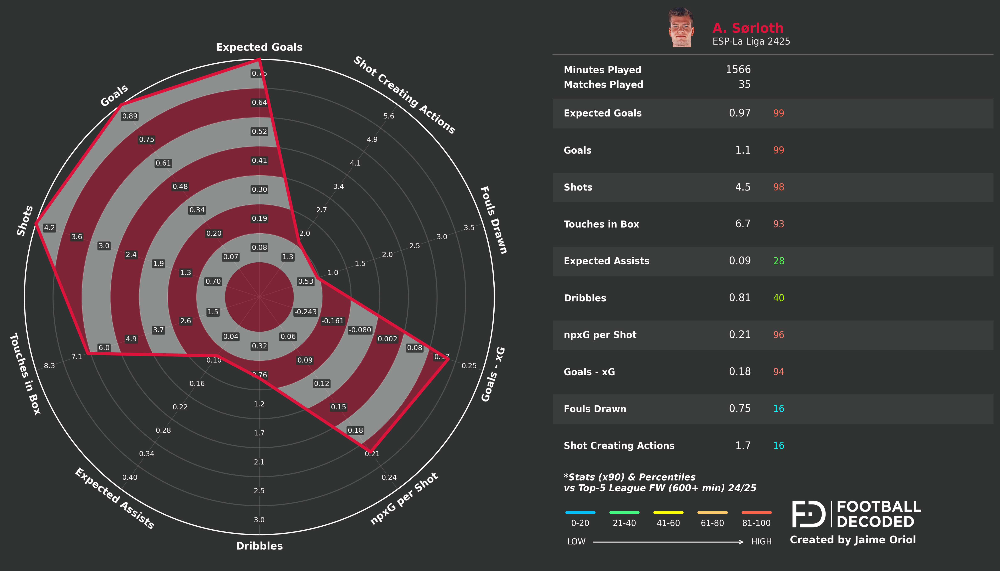

In [12]:
# 9. RADAR INDIVIDUAL SORLOTH COMPLETO
from viz.swarm_radar import create_player_radar
from viz.stats_radar import create_stats_table, combine_radar_and_table
from IPython.display import Image as IPImage, display

if 'Sørloth' in player_data:
    sorloth_id = player_data['Sørloth']['id']
    
    print("Generando radar individual Sorloth completo...")
    
    # Radar traditional (sin swarm)
    create_player_radar(
        df_data=df_final,
        player_1_id=sorloth_id,
        player_2_id=None,
        metrics=fw_metrics,
        metric_titles=fw_titles,
        team_colors=['#DC143C', '#FFFFFF'],
        save_path='figures/sorloth_radar_individual.png',
        use_swarm=False,
        show_plot=False
    )
    
    # Tabla individual con cara
    create_stats_table(
        df_data=df_final,
        player_1_id=sorloth_id,
        player_2_id=None,
        metrics=fw_metrics,
        metric_titles=fw_titles,
        team_colors=['#DC143C'],
        save_path='figures/sorloth_table_individual.png',
        team_logos={player_data['Sørloth']['team']: player_data['Sørloth']['cara']},
        footer_text="Stats (x90) & Percentiles\nvs Top-5 League FW (600+ min) 24/25",
        show_plot=False
    )
    
    # Combinar
    combine_radar_and_table(
        radar_path='figures/sorloth_radar_individual.png',
        table_path='figures/sorloth_table_individual.png',
        output_path='figures/sorloth_individual_COMBINED.png'
    )
    
    print("✓ Radar individual completo guardado")
    display(IPImage('figures/sorloth_individual_COMBINED.png'))
else:
    print("✗ Sorloth no encontrado")


Generando: Sorloth vs Haaland...


✓ Completado


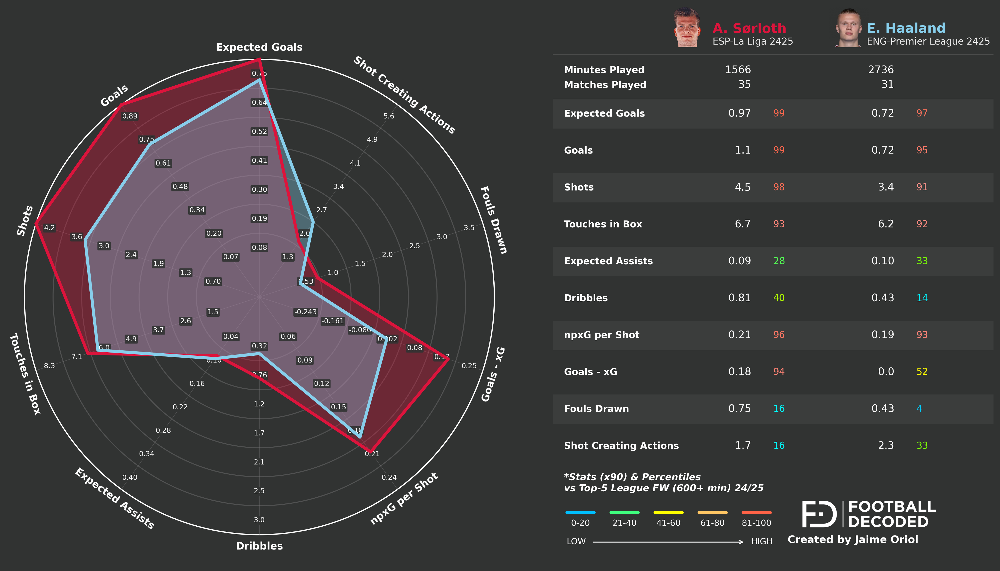


Generando: Sorloth vs Guirassy...
✓ Completado


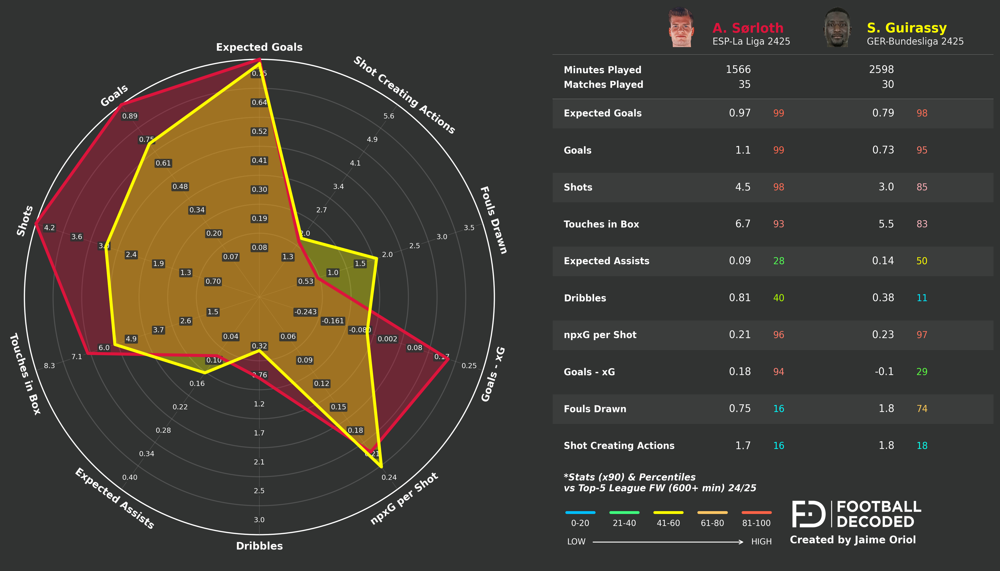


Generando: Sorloth vs Lewandowski...
✓ Completado


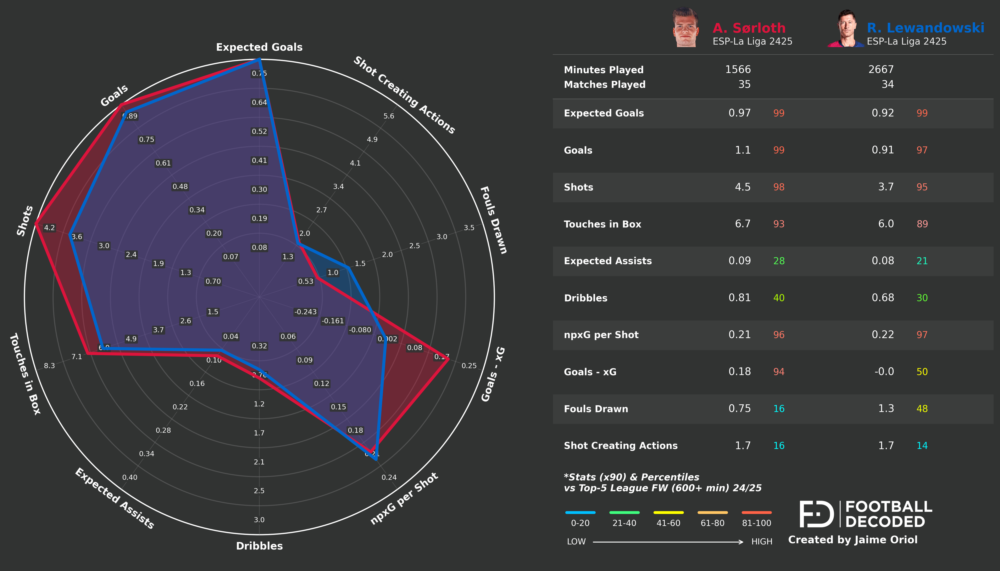


Generando: Sorloth vs Retegui...
✓ Completado


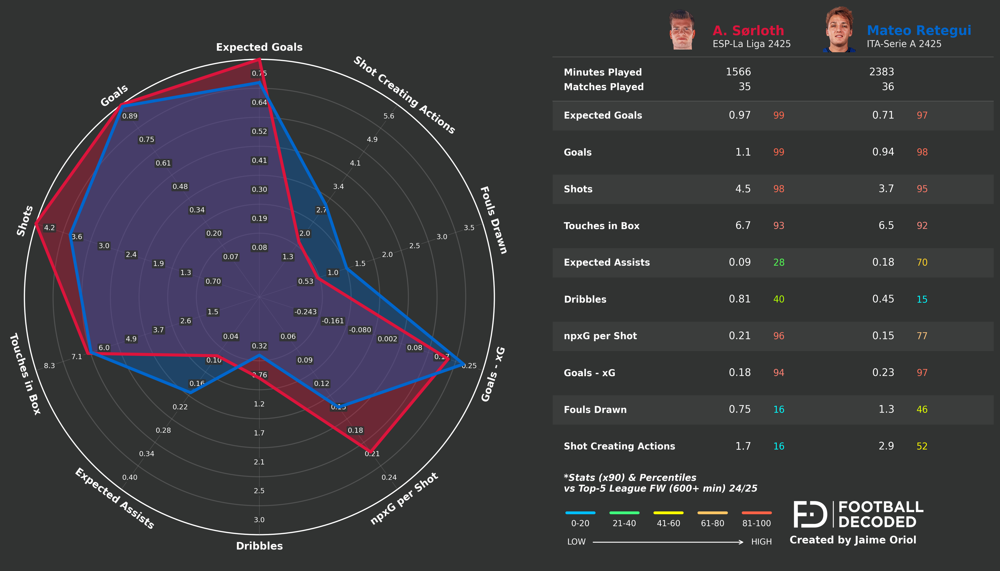


✓ Todos los radares completados


In [13]:
# 10. RADARES COMPARATIVOS
from viz.stats_radar import create_stats_table, combine_radar_and_table

comparisons = [
    ('Haaland', '#87CEEB'),
    ('Guirassy', '#FFFF00'),
    ('Lewandowski', '#0066CC'),
    ('Retegui', '#0066CC')
]

if 'Sørloth' in player_data:
    sorloth_id = player_data['Sørloth']['id']
    
    for opponent, color in comparisons:
        if opponent in player_data:
            opponent_id = player_data[opponent]['id']
            
            print(f"\nGenerando: Sorloth vs {opponent}...")
            
            # Radar
            create_player_radar(
                df_data=df_final,
                player_1_id=sorloth_id,
                player_2_id=opponent_id,
                metrics=fw_metrics,
                metric_titles=fw_titles,
                team_colors=['#DC143C', color],
                save_path=f'figures/sorloth_vs_{opponent.lower()}_radar.png',
                use_swarm=False,
                show_plot=False
            )
            
            # Tabla
            create_stats_table(
                df_data=df_final,
                player_1_id=sorloth_id,
                player_2_id=opponent_id,
                metrics=fw_metrics,
                metric_titles=fw_titles,
                team_colors=['#DC143C', color],
                save_path=f'figures/sorloth_vs_{opponent.lower()}_table.png',
                team_logos={
                    player_data['Sørloth']['team']: player_data['Sørloth']['cara'],
                    player_data[opponent]['team']: player_data[opponent]['cara']
                },
                footer_text="Stats (x90) & Percentiles\nvs Top-5 League FW (600+ min) 24/25",
                show_plot=False
            )
            
            # Combinar
            combine_radar_and_table(
                radar_path=f'figures/sorloth_vs_{opponent.lower()}_radar.png',
                table_path=f'figures/sorloth_vs_{opponent.lower()}_table.png',
                output_path=f'figures/sorloth_vs_{opponent.lower()}_COMBINED.png'
            )
            
            print(f"✓ Completado")
            display(IPImage(f'figures/sorloth_vs_{opponent.lower()}_COMBINED.png'))
        else:
            print(f"✗ {opponent} no encontrado")

print("\n✓ Todos los radares completados")


Generando scatter xG vs Goals (totales)...


2025-09-23 16:16:48,104 - adjustText - WARNING - Looks like you are using a tranform that doesn't support FancyArrowPatch, using ax.annotate instead. The arrows might strike through texts. Increasing shrinkA in arrowprops might help.


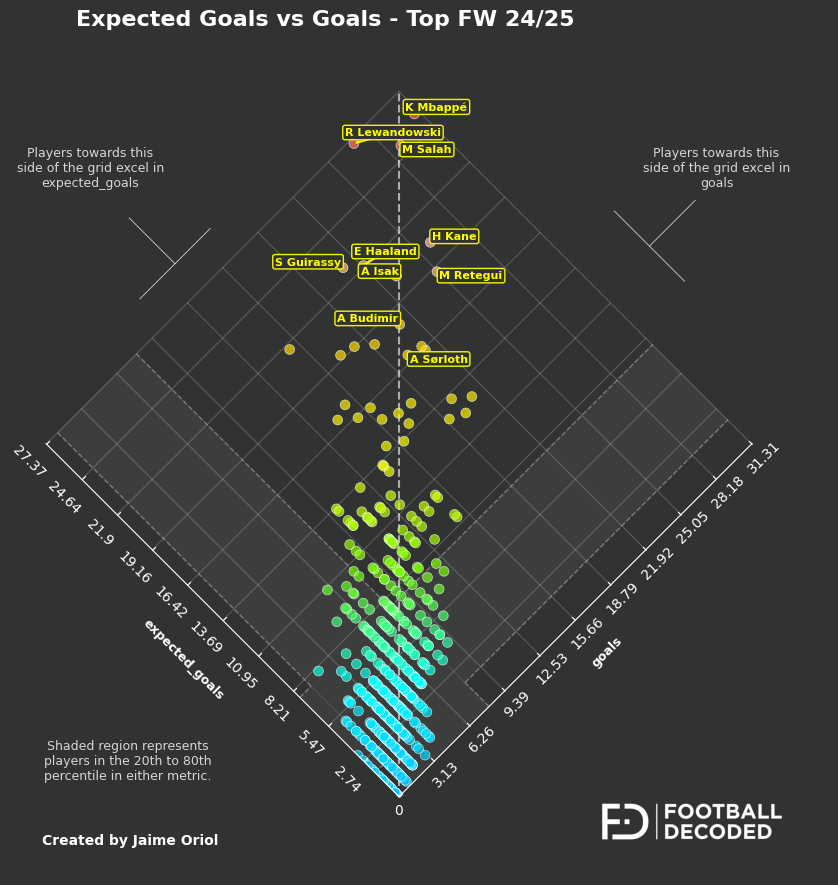

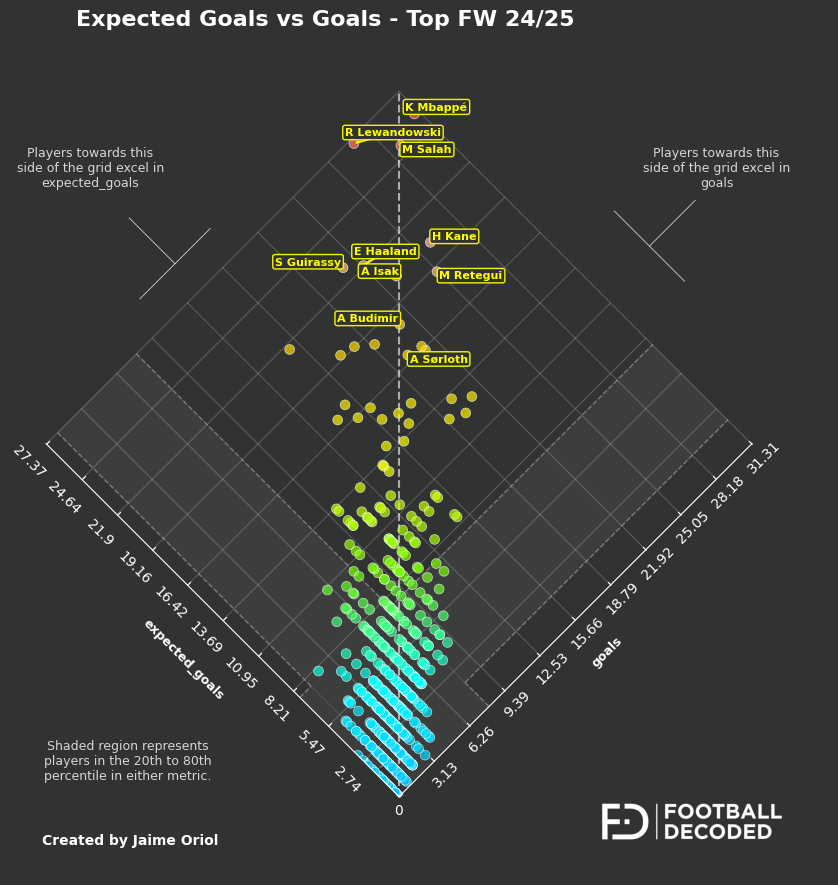

In [14]:
# 11. SCATTER: xG vs GOALS (TOTALES)
from viz.scatter import create_diamond_scatter

print("\nGenerando scatter xG vs Goals (totales)...")
create_diamond_scatter(
    df=df_final,
    x_metric='expected_goals',
    y_metric='goals',
    title='Expected Goals vs Goals - Top FW 24/25',
    save_filename='scatter_xg_goals_total.png'
)


Generando scatter xG/90 vs Goals/90...


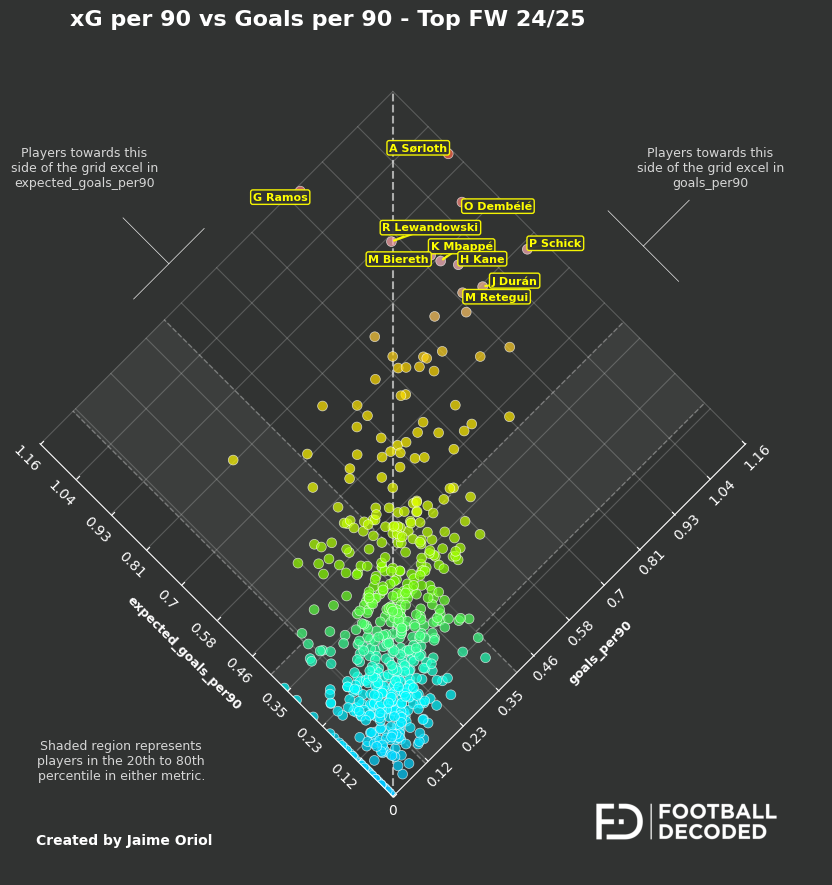

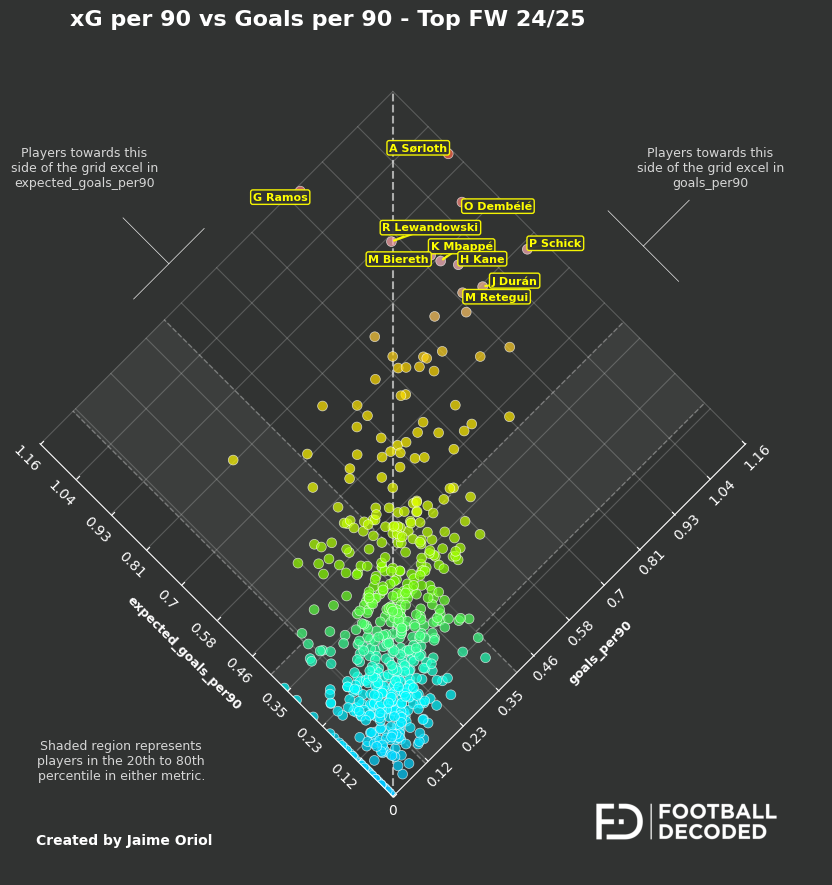

In [15]:
# 12. SCATTER: xG/90 vs GOALS/90
print("\nGenerando scatter xG/90 vs Goals/90...")
create_diamond_scatter(
    df=df_final,
    x_metric='expected_goals_per90',
    y_metric='goals_per90',
    title='xG per 90 vs Goals per 90 - Top FW 24/25',
    save_filename='scatter_xg90_goals90.png'
)


Generando scatter Box Touches vs Goals...


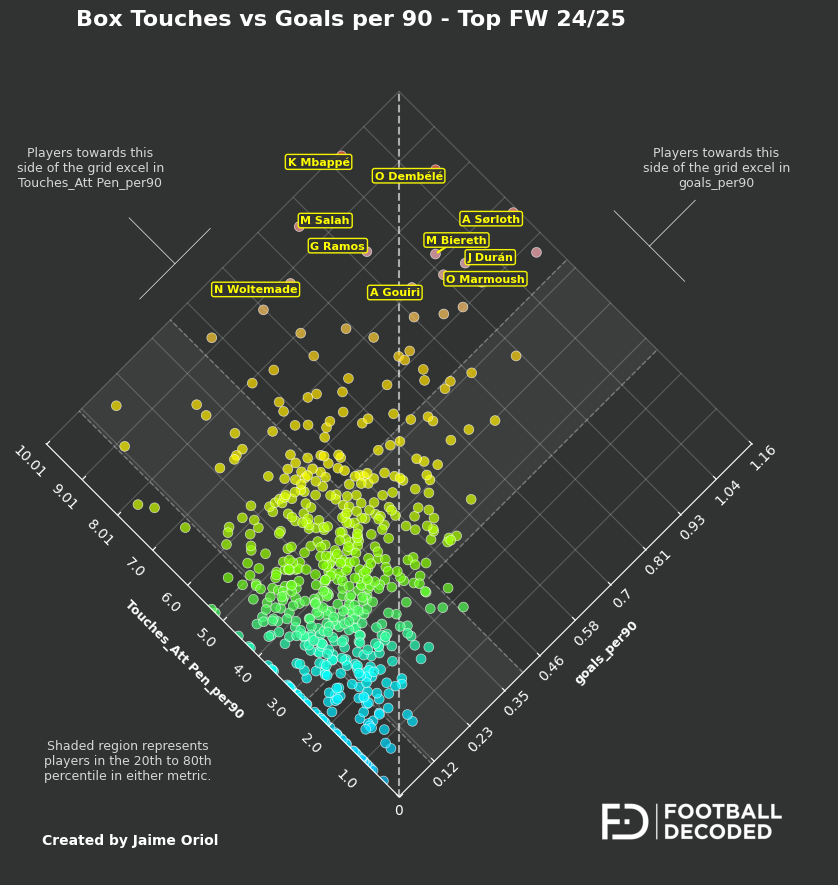

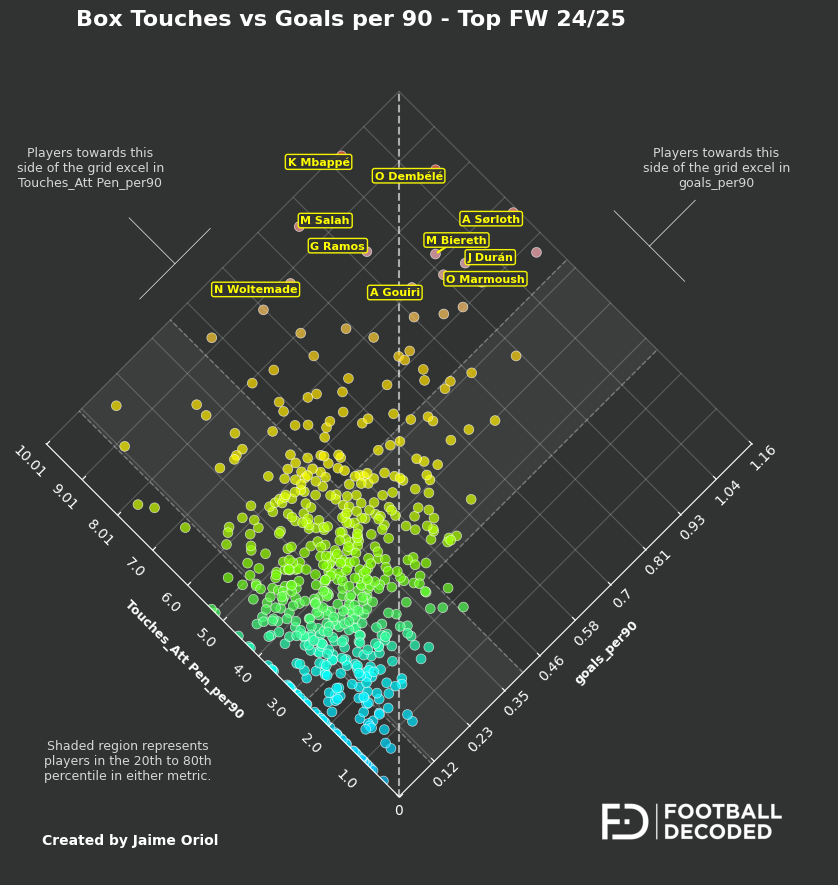

In [16]:
# 13. SCATTER: BOX TOUCHES vs GOALS
print("\nGenerando scatter Box Touches vs Goals...")
create_diamond_scatter(
    df=df_final,
    x_metric='Touches_Att Pen_per90',
    y_metric='goals_per90',
    title='Box Touches vs Goals per 90 - Top FW 24/25',
    save_filename='scatter_box_touches_goals.png'
)